# 05 — Notebook de Evaluación · Proyecto Vena

Notebook unificado para la exposición final. Carga los modelos entrenados
y genera visualizaciones interpretables.

**Secciones:**
1. **Clasificación + Grad-CAM** — Olimpia
2. **Regresión de edad** — (por implementar)
3. **Agrupamiento (clustering)** — (por implementar)
4. **Demo integrada** — función que evalúa una radiografía con los tres modelos

---

## Requisitos previos

Los siguientes archivos deben estar disponibles en `RUTA_CHECKPOINTS`:

| Archivo | Notebook origen | Descripción |
|---|---|---|
| `mejor_modelo_clasificacion_v4_f2.keras` | NB02 v4 | Modelo de clasificación completo |
| `regresion_v3.h5` | NB03 v2 | Modelo de regresión de edad |
| *(pendiente)* | NB04 | Modelo/artefactos de clustering |

Y el DatasetV2 descomprimido con sus CSVs master.

## Celda 1 — Montar Drive, descomprimir DatasetV2 y definir rutas

El DatasetV2 (96k imágenes) está almacenado como ZIP en Google Drive.
Descomprimirlo al disco local de Colab (`/content/`) es mucho más rápido
que leer imágenes directamente desde Drive vía FUSE (~2 min vs horas).

Si ya se descomprimió en una ejecución anterior de la misma sesión,
la celda detecta la carpeta existente y no repite el proceso.

In [ ]:
# ══════════════════════════════════════════════════════════════════════
# CELDA 1 — Montar Drive, descomprimir DatasetV2 y definir rutas
# ══════════════════════════════════════════════════════════════════════

import time
from pathlib import Path
from google.colab import drive

# ── 1. Montar Google Drive ────────────────────────────────────────────
drive.mount("/content/drive")

# ── 2. Rutas del proyecto ─────────────────────────────────────────────
RUTA_VENA        = Path("/content/drive/MyDrive/Vena")
RUTA_CHECKPOINTS = RUTA_VENA / "checkpoints"
RUTA_ZIP         = RUTA_VENA / "Notebooks" / "Datasets" / "DatasetV2.zip"

# Destino local — disco de Colab, NO en Drive
# Leer desde disco local es ~50× más rápido que desde Drive vía FUSE
RUTA_BASE = Path("/content/DatasetV2")

# ── 3. Descomprimir DatasetV2 (si no está ya) ─────────────────────────
# Verificar primero si ya existe la carpeta con los CSVs.
# Si la sesión de Colab sigue activa desde una ejecución anterior,
# no necesitamos descomprimir de nuevo.
csvs_esperados = ["master_train.csv", "master_val.csv", "master_test.csv"]
ya_descomprimido = all((RUTA_BASE / csv).exists() for csv in csvs_esperados)

if ya_descomprimido:
    print(f"DatasetV2 ya existe en {RUTA_BASE} — no se descomprime de nuevo.")
else:
    assert RUTA_ZIP.exists(), (
        f"No se encontró el ZIP en: {RUTA_ZIP}\n"
        "Verificar que la ruta es correcta y que el archivo existe en Drive."
    )
    print(f"Descomprimiendo {RUTA_ZIP.name} → {RUTA_BASE}")
    print("Esto toma ~2-5 minutos dependiendo de la velocidad de Drive...")
    inicio = time.time()

    # unzip -q (quiet) -o (overwrite sin preguntar) -d (directorio destino)
    !unzip -q -o "{RUTA_ZIP}" -d "/content/"

    # Verificar que la estructura quedó correcta
    # A veces el ZIP tiene una carpeta interna "DatasetV2/DatasetV2/"
    # Si los CSVs no están en RUTA_BASE, buscar un nivel más abajo
    if not (RUTA_BASE / "master_train.csv").exists():
        sub = RUTA_BASE / "DatasetV2"
        if (sub / "master_train.csv").exists():
            RUTA_BASE = sub
            print(f"  Estructura anidada detectada — RUTA_BASE ajustada a: {RUTA_BASE}")

    duracion = time.time() - inicio
    print(f"Descompresión completada en {duracion:.0f} segundos.")

# ── 4. Verificar archivos ─────────────────────────────────────────────
for csv in csvs_esperados:
    assert (RUTA_BASE / csv).exists(), f"Falta: {RUTA_BASE / csv}"

# ── 5. Rutas a modelos ────────────────────────────────────────────────
RUTA_MODELO_CLAS = RUTA_CHECKPOINTS / "mejor_modelo_clasificacion_v4_f2.keras"
RUTA_MODELO_REG  = RUTA_CHECKPOINTS / "regresion_v4.keras"
# RUTA_MODELO_CLUST = RUTA_CHECKPOINTS / "..."  # pendiente NB04
RUTA_MODELOS_CLUSTER = RUTA_VENA / "Notebooks" / "Apoyo" / "Agrupacion" / "modelos_produccion"


print(f"\n{'═' * 55}")
print("VERIFICACIÓN DE ARCHIVOS")
print(f"{'═' * 55}")
print(f"  DatasetV2      : {RUTA_BASE} — OK")
print(f"  Clasificación  : {RUTA_MODELO_CLAS.name} — {'OK' if RUTA_MODELO_CLAS.exists() else 'NO ENCONTRADO'}")
print(f"  Regresión      : {RUTA_MODELO_REG.name} — {'OK' if RUTA_MODELO_REG.exists() else 'NO ENCONTRADO'}")
print(f"  Checkpoints en : {RUTA_CHECKPOINTS}")

Mounted at /content/drive
Descomprimiendo DatasetV2.zip → /content/DatasetV2
Esto toma ~2-5 minutos dependiendo de la velocidad de Drive...
Descompresión completada en 46 segundos.

═══════════════════════════════════════════════════════
VERIFICACIÓN DE ARCHIVOS
═══════════════════════════════════════════════════════
  DatasetV2      : /content/DatasetV2 — OK
  Clasificación  : mejor_modelo_clasificacion_v4_f2.keras — OK
  Regresión      : regresion_v4.keras — OK
  Checkpoints en : /content/drive/MyDrive/Vena/checkpoints


## Celda 2 — Importaciones

Todo lo necesario para las tres secciones. No se usan librerías externas
para Grad-CAM — se implementa manualmente con `tf.GradientTape` para
entender exactamente qué ocurre internamente.

In [ ]:
# ══════════════════════════════════════════════════════════════════════
# CELDA 2 — Importaciones
# ══════════════════════════════════════════════════════════════════════

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import tensorflow as tf
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay,
                             classification_report, roc_curve, auc)
import joblib # Modificado por Diego
import umap # Modificado por Diego

# Semilla para reproducibilidad
np.random.seed(42)
tf.random.set_seed(42)

# Constantes compartidas
TAMANO_IMAGEN = 224
UMBRAL_CLAS   = 0.38  # umbral calibrado en NB02 v4

print(f"TensorFlow : {tf.__version__}")
print(f"GPU        : {tf.config.list_physical_devices('GPU') or 'No detectada (CPU)'}")

TensorFlow : 2.19.0
GPU        : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## Celda 3 — Cargar modelo de clasificación y datos de test

Se carga el checkpoint de Fase 2 (`_f2.keras`) que contiene el modelo
completo: backbone DenseNet121 fine-tuneado + cabeza de clasificación.

El CSV `master_test.csv` contiene las rutas relativas de las imágenes
de test y sus etiquetas (0 = Normal, 1 = Anomalía).

In [ ]:
# ══════════════════════════════════════════════════════════════════════
# CELDA 3 — Cargar modelo de clasificación y test CSV
# ══════════════════════════════════════════════════════════════════════
modelo_clas = load_model(str(RUTA_MODELO_CLAS))
print(f"Modelo cargado: {RUTA_MODELO_CLAS.name}")
print(f"  Entrada : {modelo_clas.input_shape}")
print(f"  Salida  : {modelo_clas.output_shape}")



# Cargar test set
df_test = pd.read_csv(RUTA_BASE / "master_test.csv")
df_test["label"] = df_test["label"].astype(int)

# Construir ruta completa a cada imagen
# En el CSV, 'path' es relativo a RUTA_BASE (ej: "test/NIH/imagen.png")
df_test["ruta_completa"] = df_test["path"].apply(lambda p: str(RUTA_BASE / p))

n_anomalas = df_test["label"].sum()
n_normales = len(df_test) - n_anomalas
print(f"\nTest set: {len(df_test):,} imágenes")
print(f"  Normales  (0): {n_normales:,}")
print(f"  Anomalías (1): {n_anomalas:,}")

Modelo cargado: mejor_modelo_clasificacion_v4_f2.keras
  Entrada : (None, 224, 224, 3)
  Salida  : (None, 1)

Test set: 14,684 imágenes
  Normales  (0): 6,345
  Anomalías (1): 8,339


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 176 variables whereas the saved optimizer has 180 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
#Cargar el modelo de Regresion
#Modificado por Marvin
# ── Cargar modelo de regresión ────────────────────────────────────────
EDAD_MEDIA = 50.3
EDAD_STD   = 17.1
modelo_reg = load_model(str(RUTA_MODELO_REG), compile=False)
print(f"  Regresión      : {RUTA_MODELO_REG.name} — {'OK' if RUTA_MODELO_REG.exists() else 'NO ENCONTRADO'}")
print(f" Entrada: {modelo_reg.input_shape}")
print(f"  Salida: {modelo_reg.output_shape}")

  Regresión      : regresion_v4.keras — OK
 Entrada: (None, 224, 224, 3)
  Salida: (None, 1)


In [ ]:
# Modificado por Diego
# ── Construir extractor de embeddings (para clustering) ───────────────
extractor = Model(inputs=modelo_clas.input,
                  outputs=modelo_clas.layers[-5].output,
                  name='extractor')
extractor.trainable = False
print(f'  Extractor   : listo → {extractor.output_shape}')

  Extractor   : listo → (None, 1024)


## Celda 4 — Identificar la capa convolucional objetivo para Grad-CAM

### ¿Qué es Grad-CAM y por qué lo necesitamos?

Grad-CAM (Gradient-weighted Class Activation Mapping) responde a la
pregunta: **"¿qué partes de la imagen fueron más importantes para la
predicción del modelo?"**

La idea fundamental:

1. El backbone DenseNet121 produce un **mapa de features** de forma
   `(7, 7, 1024)` — es decir, 1024 "filtros" de 7×7 píxeles cada uno.
   Cada filtro detecta un patrón visual diferente.

2. Calculamos los **gradientes** de la salida del modelo (probabilidad
   de anomalía) respecto a ese mapa de features. Los gradientes nos
   dicen: "si este filtro se activara un poco más, ¿la probabilidad
   de anomalía subiría o bajaría?"

3. Promediamos los gradientes espacialmente (sobre los 7×7 píxeles)
   para obtener **un peso por filtro** — esto nos dice qué filtros
   son más relevantes para la predicción.

4. Hacemos una **combinación ponderada** de los 1024 mapas usando
   esos pesos, aplicamos ReLU (nos quedamos solo con regiones que
   contribuyen positivamente), y redimensionamos a 224×224.

El resultado es un **mapa de calor** que se superpone sobre la
radiografía: rojo = "el modelo miró aquí para decidir".

---

Para DenseNet121, la última capa convolucional (antes del pooling)
se llama `conv5_block16_concat` — es la que produce el tensor
`(7, 7, 1024)`. Esta celda la identifica automáticamente.

In [ ]:
# ══════════════════════════════════════════════════════════════════════
# CELDA 4 — Identificar la capa convolucional objetivo
# ══════════════════════════════════════════════════════════════════════
#
# Necesitamos encontrar la ÚLTIMA capa convolucional del backbone.
# En DenseNet121 se llama "conv5_block16_concat" y su salida tiene
# forma (None, 7, 7, 1024).
#
# ¿Por qué la última y no otra?
# - Las primeras capas detectan bordes y texturas genéricas
# - Las últimas capas detectan patrones de alto nivel (opacidades,
#   ensanchamiento mediastínico, etc.) — más relevantes clínicamente
# - Además, el mapa de 7×7 tiene suficiente resolución espacial
#   para localizar regiones en la radiografía

# Estrategia: recorrer las capas del modelo de atrás hacia adelante
# y buscar la primera cuya salida sea 4D (batch, alto, ancho, canales).
# Esa es la última capa convolucional antes del GlobalAveragePooling.
#
# Nota técnica: en Keras 3 (TF >= 2.16) el atributo .output_shape de
# una capa individual ya no existe — fue deprecado. En su lugar usamos
# capa.output.shape, que accede al tensor de salida del grafo y lee su
# forma. Funcionalmente es lo mismo, pero la API cambió.

nombre_capa_conv = None
for capa in reversed(modelo_clas.layers):
    try:
        # capa.output.shape devuelve un TensorShape, ej: (None, 7, 7, 1024)
        forma = tuple(capa.output.shape)
    except (AttributeError, RuntimeError):
        # Algunas capas (como InputLayer) pueden no tener .output accesible
        continue
    # Buscamos forma 4D: (None, H, W, C) con H > 1 y W > 1
    if len(forma) == 4 and forma[1] is not None and forma[1] > 1:
        nombre_capa_conv = capa.name
        break

print(f"Capa objetivo para Grad-CAM: {nombre_capa_conv}")
print(f"  Forma de salida: {tuple(modelo_clas.get_layer(nombre_capa_conv).output.shape)}")
print()

# Verificación: forma debe ser (None, 7, 7, 1024) — la última capa conv del DenseNet121
assert nombre_capa_conv is not None, "No se encontró capa convolucional"
forma_objetivo = tuple(modelo_clas.get_layer(nombre_capa_conv).output.shape)
assert forma_objetivo == (None, 7, 7, 1024), (
    f"Forma inesperada: {forma_objetivo}. Se esperaba (None, 7, 7, 1024)."
)
print("Verificación OK — forma (None, 7, 7, 1024) confirmada.")

Capa objetivo para Grad-CAM: relu
  Forma de salida: (None, 7, 7, 1024)

Verificación OK — forma (None, 7, 7, 1024) confirmada.


## Celda 5 — Función Grad-CAM paso a paso

Esta es la implementación central. Cada línea está comentada para
entender el flujo matemático:

```
imagen (224×224×3)
     │
     ▼
DenseNet121 backbone
     │
     ├──► mapa de features (7×7×1024)  ◄── lo capturamos aquí
     │
     ▼
GlobalAveragePooling2D
     │
     ▼
BatchNorm → Dense(256) → Dropout → Dense(1, sigmoid)
     │
     ▼
probabilidad de anomalía  ◄── gradientes fluyen desde aquí hacia atrás
```

El `tf.GradientTape` registra todas las operaciones del forward pass
para poder calcular gradientes en reversa (backpropagation).

In [ ]:
# ══════════════════════════════════════════════════════════════════════
# CELDA 5 — Función Grad-CAM
# ══════════════════════════════════════════════════════════════════════

def generar_gradcam(modelo, imagen_array, nombre_capa_objetivo):
    """
    Genera un mapa de calor Grad-CAM para una imagen.

    Parámetros
    ----------
    modelo : tf.keras.Model
        Modelo completo de clasificación (backbone + cabeza).
    imagen_array : np.ndarray
        Imagen preprocesada con forma (1, 224, 224, 3), valores en [0, 1].
    nombre_capa_objetivo : str
        Nombre de la última capa convolucional (ej: 'conv5_block16_concat').

    Retorna
    -------
    heatmap : np.ndarray
        Mapa de calor normalizado [0, 1] con forma (7, 7).
    probabilidad : float
        Probabilidad de anomalía predicha por el modelo.
    """

    # ── Paso 1: Crear un sub-modelo con dos salidas ───────────────────
    # Necesitamos acceder simultáneamente a:
    #   (a) la salida de la capa convolucional (mapa de features 7×7×1024)
    #   (b) la predicción final del modelo (probabilidad de anomalía)
    #
    # ¿Por qué un sub-modelo? Porque tf.GradientTape necesita "ver"
    # ambas salidas en el mismo forward pass para calcular gradientes.
    capa_conv   = modelo.get_layer(nombre_capa_objetivo)
    grad_modelo = Model(
        inputs  = modelo.input,
        outputs = [capa_conv.output, modelo.output]
    )

    # ── Paso 2: Forward pass con grabación de gradientes ──────────────
    # tf.GradientTape funciona como una "cinta de grabación":
    # registra cada operación matemática del forward pass para poder
    # reproducirla en reversa y calcular derivadas parciales.
    with tf.GradientTape() as tape:
        # Forward: imagen → mapa de features + predicción
        salida_conv, prediccion = grad_modelo(imagen_array)
        # prediccion tiene forma (1, 1) — extraemos el escalar
        prob = prediccion[0, 0]

    # ── Paso 3: Calcular gradientes ───────────────────────────────────
    # ∂prob/∂salida_conv = "¿cómo cambia la probabilidad de anomalía
    # si cada valor del mapa de features cambia un poquito?"
    #
    # Resultado: tensor de misma forma que salida_conv → (1, 7, 7, 1024)
    gradientes = tape.gradient(prob, salida_conv)

    # ── Paso 4: Calcular pesos por canal ──────────────────────────────
    # Global Average Pooling de los gradientes sobre las dimensiones
    # espaciales (7×7). Resultado: un peso por cada uno de los 1024 canales.
    #
    # Intuición: si el gradiente promedio del canal k es alto, ese canal
    # fue muy importante para predecir "anomalía".
    pesos = tf.reduce_mean(gradientes, axis=(0, 1, 2))  # forma: (1024,)

    # ── Paso 5: Combinación ponderada ─────────────────────────────────
    # Multiplicamos cada mapa de 7×7 por su peso y sumamos.
    # salida_conv[0] tiene forma (7, 7, 1024)
    # pesos tiene forma (1024,)
    # La multiplicación elemento a elemento broadcast sobre (7, 7)
    # y la suma sobre el eje de canales nos da un mapa de (7, 7).
    mapa = salida_conv[0] @ pesos[..., tf.newaxis]  # (7, 7, 1)
    mapa = tf.squeeze(mapa)                          # (7, 7)

    # ── Paso 6: ReLU + normalización ──────────────────────────────────
    # ReLU: nos quedamos solo con las regiones que contribuyen
    # POSITIVAMENTE a la clase de anomalía (valores negativos = regiones
    # que empujan hacia "normal", no nos interesan para visualizar).
    mapa = tf.nn.relu(mapa)

    # Normalizar a [0, 1] para poder superponerlo como mapa de calor
    maximo = tf.reduce_max(mapa)
    if maximo > 0:
        mapa = mapa / maximo

    return mapa.numpy(), float(prob)


print("Función generar_gradcam() definida.")

Función generar_gradcam() definida.


## Celda 6 — Funciones auxiliares de visualización

Dos funciones:
- `cargar_imagen()`: lee una radiografía del disco y la preprocesa
  exactamente igual que durante el entrenamiento (resize a 224×224,
  escalar a [0, 1]).
- `superponer_heatmap()`: toma el mapa de calor de 7×7, lo agranda
  a 224×224 con interpolación bicúbica, le aplica un colormap (jet)
  y lo mezcla con la imagen original.

In [ ]:
# ══════════════════════════════════════════════════════════════════════
# CELDA 6 — Funciones auxiliares de visualización
# ══════════════════════════════════════════════════════════════════════

def cargar_imagen(ruta, tamano=TAMANO_IMAGEN):
    """
    Carga una imagen y la preprocesa para el modelo.

    Retorna
    -------
    img_batch : np.ndarray, forma (1, 224, 224, 3), valores [0, 1]
        Listo para pasar al modelo.
    img_display : np.ndarray, forma (224, 224, 3), valores [0, 1]
        Para visualización con matplotlib.
    """
    # load_img de Keras: lee la imagen y la redimensiona
    img = load_img(ruta, target_size=(tamano, tamano))
    # img_to_array: convierte PIL Image a numpy array (float32)
    arr = img_to_array(img)
    # Escalar a [0, 1] — mismo preproceso que el generador de entrenamiento
    arr = arr / 255.0
    # Agregar dimensión de batch: (224, 224, 3) → (1, 224, 224, 3)
    return np.expand_dims(arr, axis=0), arr


def superponer_heatmap(imagen, heatmap, alfa=0.4, colormap="jet"):
    """
    Superpone el mapa de calor Grad-CAM sobre la imagen original.

    Parámetros
    ----------
    imagen : np.ndarray (224, 224, 3)
        Imagen original en [0, 1].
    heatmap : np.ndarray (7, 7)
        Mapa de calor Grad-CAM normalizado en [0, 1].
    alfa : float
        Transparencia del mapa de calor. 0 = solo imagen, 1 = solo calor.
    colormap : str
        Colormap de matplotlib. "jet" va de azul (bajo) a rojo (alto).

    Retorna
    -------
    superposicion : np.ndarray (224, 224, 3) en [0, 1]
    """
    # Redimensionar heatmap de 7×7 a 224×224
    # Usamos tf.image.resize con interpolación bicúbica para un
    # degradado suave (nearest neighbor daría bloques pixelados)
    heatmap_grande = tf.image.resize(
        heatmap[..., np.newaxis],     # (7, 7) → (7, 7, 1)
        (imagen.shape[0], imagen.shape[1]),
        method="bicubic"
    ).numpy().squeeze()               # → (224, 224)

    # Recortar a [0, 1] (la interpolación bicúbica puede generar
    # valores ligeramente fuera de rango)
    heatmap_grande = np.clip(heatmap_grande, 0, 1)

    # Aplicar colormap: convierte escalar → RGBA
    colores = plt.get_cmap(colormap)(heatmap_grande) # (224, 224, 4)
    colores = colores[:, :, :3]                       # descartar alfa → (224, 224, 3)

    # Mezclar: superposición = (1 - alfa) * imagen + alfa * colormap
    superposicion = (1 - alfa) * imagen + alfa * colores
    return np.clip(superposicion, 0, 1)


print("Funciones cargar_imagen() y superponer_heatmap() definidas.")

Funciones cargar_imagen() y superponer_heatmap() definidas.


## Celda 7 — Seleccionar imágenes representativas para Grad-CAM

Para que la visualización sea útil en la exposición, seleccionamos
imágenes que representen los **cuatro escenarios** de la matriz de
confusión:

| Escenario | Etiqueta real | Predicción | Significado clínico |
|---|---|---|---|
| **VP** (Verdadero Positivo) | Anomalía | Anomalía | Detección correcta |
| **VN** (Verdadero Negativo) | Normal | Normal | Descarte correcto |
| **FP** (Falso Positivo) | Normal | Anomalía | Falsa alarma |
| **FN** (Falso Negativo) | Anomalía | Normal | Anomalía no detectada |

Grad-CAM en cada escenario revela comportamientos distintos:
- **VP**: ¿el modelo mira la lesión real?
- **VN**: ¿el mapa de calor es difuso (no hay nada que señalar)?
- **FP**: ¿qué confundió al modelo? (artefacto, variante anatómica...)
- **FN**: ¿el modelo miró otra región en vez de la lesión?

In [ ]:
# ══════════════════════════════════════════════════════════════════════
# CELDA 7 — Seleccionar imágenes representativas
# ══════════════════════════════════════════════════════════════════════
#
# Primero generamos predicciones sobre todo el test set para poder
# clasificar cada imagen en VP/VN/FP/FN.
#
# Nota: esto puede tomar unos minutos (~14k imágenes).
# Si solo quieres una demo rápida, reduce N_MUESTRA.

from tensorflow.keras.preprocessing.image import ImageDataGenerator

gen_test = ImageDataGenerator(rescale=1.0 / 255)
flujo_test = gen_test.flow_from_dataframe(
    dataframe   = df_test,
    directory   = str(RUTA_BASE),
    x_col       = "path",
    y_col       = "label",
    class_mode  = "raw",
    target_size = (TAMANO_IMAGEN, TAMANO_IMAGEN),
    batch_size  = 64,
    shuffle     = False,
    color_mode  = "rgb",
    seed        = 42
)

print("Generando predicciones sobre test set...")
probabilidades = modelo_clas.predict(flujo_test, verbose=1)
probabilidades = probabilidades[:len(df_test)].flatten()

# Clasificar cada imagen
df_test["prob"]       = probabilidades
df_test["pred"]       = (probabilidades >= UMBRAL_CLAS).astype(int)
df_test["escenario"]  = ""  # se llena abajo

# Asignar escenario
df_test.loc[(df_test["label"] == 1) & (df_test["pred"] == 1), "escenario"] = "VP"
df_test.loc[(df_test["label"] == 0) & (df_test["pred"] == 0), "escenario"] = "VN"
df_test.loc[(df_test["label"] == 0) & (df_test["pred"] == 1), "escenario"] = "FP"
df_test.loc[(df_test["label"] == 1) & (df_test["pred"] == 0), "escenario"] = "FN"

print("\nDistribución de escenarios:")
print(df_test["escenario"].value_counts().to_string())

# Seleccionar N_POR_ESCENARIO imágenes de cada tipo
N_POR_ESCENARIO = 2
seleccion = []
for esc in ["VP", "VN", "FP", "FN"]:
    sub = df_test[df_test["escenario"] == esc]
    if len(sub) >= N_POR_ESCENARIO:
        # Para VP y FN: elegir con probabilidad cercana al umbral (casos interesantes)
        # Para VN y FP: elegir aleatorios
        muestras = sub.sample(n=N_POR_ESCENARIO, random_state=42)
        seleccion.append(muestras)

df_seleccion = pd.concat(seleccion).reset_index(drop=True)
print(f"\nImágenes seleccionadas: {len(df_seleccion)}")
print(df_seleccion[["path", "label", "prob", "escenario"]].to_string(index=False))

Found 14684 validated image filenames.
Generando predicciones sobre test set...
230/230 ━━━━━━━━━━━━━━━━━━━━ 84s 268ms/step

Distribución de escenarios:
escenario
VP    6774
VN    4302
FP    2043
FN    1565

Imágenes seleccionadas: 8
                                               path  label     prob escenario
test/Chexpert/patient19446/study5/view1_frontal.jpg      1 0.951720        VP
test/Chexpert/patient06520/study1/view1_frontal.jpg      1 0.971169        VP
                          test/NIH/00005720_000.jpg      0 0.110830        VN
                          test/NIH/00006216_000.jpg      0 0.350636        VN
                          test/NIH/00014169_000.jpg      0 0.387326        FP
                          test/NIH/00021918_002.jpg      0 0.746670        FP
                          test/NIH/00020269_000.jpg      1 0.209548        FN
                          test/NIH/00030200_001.jpg      1 0.275262        FN


## Celda 8 — Generar y visualizar Grad-CAM

Panel principal: para cada imagen seleccionada, mostramos tres columnas:
1. **Radiografía original** con la etiqueta real
2. **Mapa de calor Grad-CAM** puro (7×7 ampliado a 224×224)
3. **Superposición** — la radiografía con el mapa de calor encima

Los colores del mapa de calor:
- **Azul/verde**: el modelo prestó poca atención a esta zona
- **Amarillo/rojo**: el modelo se enfocó fuertemente aquí para decidir

Esto es lo más valioso para la exposición: demuestra que el modelo
no es una "caja negra" — podemos ver *dónde mira* y evaluar si
sus razones tienen sentido clínico.

Figura guardada en: /content/drive/MyDrive/Vena/checkpoints/gradcam_clasificacion_v4.png


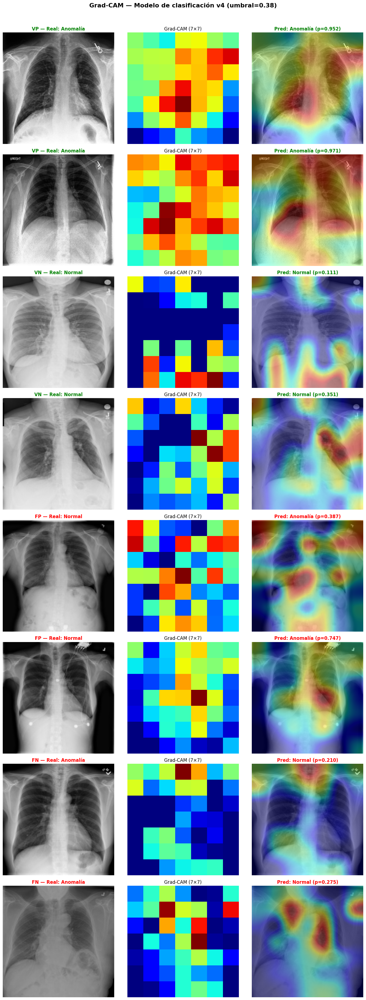

In [ ]:
# ══════════════════════════════════════════════════════════════════════
# CELDA 8 — Generar y visualizar Grad-CAM para cada imagen
# ══════════════════════════════════════════════════════════════════════

n_imgs = len(df_seleccion)
fig, axes = plt.subplots(n_imgs, 3, figsize=(14, 4.5 * n_imgs))

# Si solo hay una imagen, axes no es 2D — lo forzamos
if n_imgs == 1:
    axes = axes[np.newaxis, :]

for i, (_, fila) in enumerate(df_seleccion.iterrows()):
    # Cargar y preprocesar la imagen
    img_batch, img_display = cargar_imagen(fila["ruta_completa"])

    # Generar Grad-CAM
    heatmap, prob = generar_gradcam(modelo_clas, img_batch, nombre_capa_conv)

    # Superponer
    superposicion = superponer_heatmap(img_display, heatmap, alfa=0.4)

    # Colores de título según escenario
    colores_escenario = {"VP": "green", "VN": "green", "FP": "red", "FN": "red"}
    color = colores_escenario[fila["escenario"]]

    etiqueta_real = "Anomalía" if fila["label"] == 1 else "Normal"
    etiqueta_pred = "Anomalía" if prob >= UMBRAL_CLAS else "Normal"

    # ── Columna 1: imagen original ────────────────────────────────────
    axes[i, 0].imshow(img_display)
    axes[i, 0].set_title(
        f"{fila['escenario']} — Real: {etiqueta_real}",
        fontsize=12, fontweight="bold", color=color
    )
    axes[i, 0].axis("off")

    # ── Columna 2: mapa de calor puro ─────────────────────────────────
    im = axes[i, 1].imshow(heatmap, cmap="jet", vmin=0, vmax=1)
    axes[i, 1].set_title("Grad-CAM (7×7)", fontsize=12)
    axes[i, 1].axis("off")

    # ── Columna 3: superposición ──────────────────────────────────────
    axes[i, 2].imshow(superposicion)
    axes[i, 2].set_title(
        f"Pred: {etiqueta_pred} (p={prob:.3f})",
        fontsize=12, fontweight="bold", color=color
    )
    axes[i, 2].axis("off")

plt.suptitle(
    f"Grad-CAM — Modelo de clasificación v4 (umbral={UMBRAL_CLAS})",
    fontsize=16, fontweight="bold", y=1.01
)
plt.tight_layout()

# Guardar
ruta_gradcam = RUTA_CHECKPOINTS / "gradcam_clasificacion_v4.png"
plt.savefig(str(ruta_gradcam), dpi=150, bbox_inches="tight")
print(f"Figura guardada en: {ruta_gradcam}")
plt.show()

## Celda 9 — Grad-CAM comparativo: Normal vs Anomalía

Visualización adicional para la exposición: lado a lado, una radiografía
normal y una con anomalía, ambas con Grad-CAM.

El objetivo es mostrar que:
- En radiografías **normales**, la atención del modelo suele ser difusa
  o distribuida uniformemente (no hay nada patológico que señalar)
- En radiografías con **anomalía**, la atención se concentra en
  regiones específicas (opacidades, derrames, cardiomegalia, etc.)

Comparación guardada en: /content/drive/MyDrive/Vena/checkpoints/gradcam_comparativo_v4.png


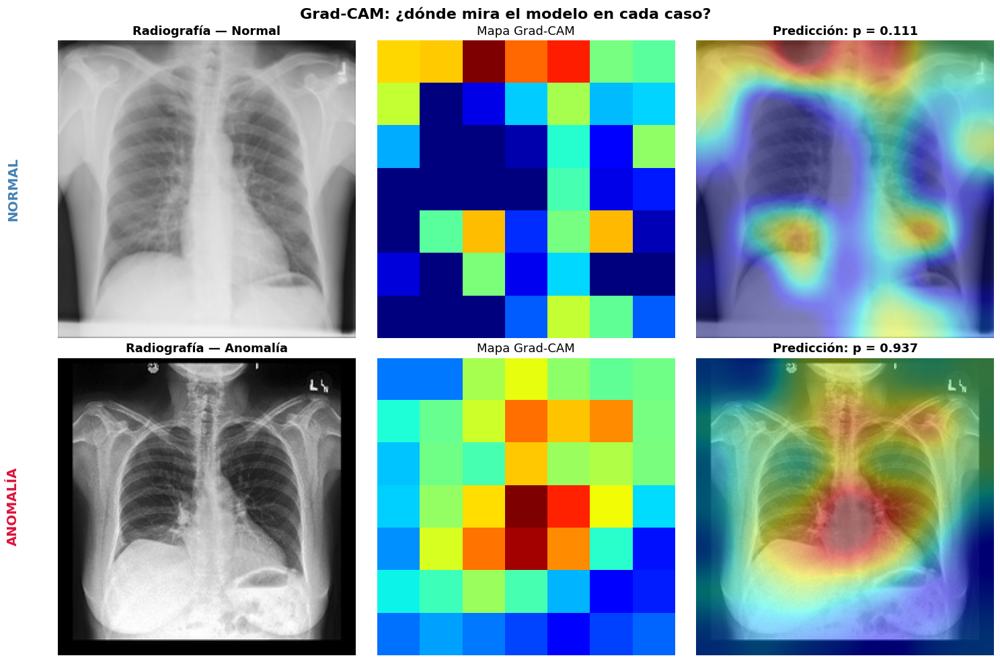

In [ ]:
# ══════════════════════════════════════════════════════════════════════
# CELDA 9 — Comparación lado a lado: Normal vs Anomalía
# ══════════════════════════════════════════════════════════════════════

# Seleccionar un VP de alta confianza y un VN de alta confianza
vp_alta = df_test[(df_test["escenario"] == "VP") & (df_test["prob"] > 0.85)]
vn_alta = df_test[(df_test["escenario"] == "VN") & (df_test["prob"] < 0.15)]

if len(vp_alta) == 0 or len(vn_alta) == 0:
    print("No se encontraron suficientes predicciones de alta confianza.")
    print("Usando umbrales menos estrictos...")
    vp_alta = df_test[df_test["escenario"] == "VP"]
    vn_alta = df_test[df_test["escenario"] == "VN"]

caso_vp = vp_alta.sample(n=1, random_state=7).iloc[0]
caso_vn = vn_alta.sample(n=1, random_state=7).iloc[0]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for fila_idx, caso in enumerate([caso_vn, caso_vp]):
    img_batch, img_display = cargar_imagen(caso["ruta_completa"])
    heatmap, prob = generar_gradcam(modelo_clas, img_batch, nombre_capa_conv)
    superposicion = superponer_heatmap(img_display, heatmap, alfa=0.45)

    etiq = "Normal" if caso["label"] == 0 else "Anomalía"
    color = "green"

    axes[fila_idx, 0].imshow(img_display)
    axes[fila_idx, 0].set_title(f"Radiografía — {etiq}", fontsize=13, fontweight="bold")
    axes[fila_idx, 0].axis("off")

    axes[fila_idx, 1].imshow(heatmap, cmap="jet", vmin=0, vmax=1)
    axes[fila_idx, 1].set_title("Mapa Grad-CAM", fontsize=13)
    axes[fila_idx, 1].axis("off")

    axes[fila_idx, 2].imshow(superposicion)
    axes[fila_idx, 2].set_title(f"Predicción: p = {prob:.3f}", fontsize=13, fontweight="bold")
    axes[fila_idx, 2].axis("off")

# Etiquetas de filas
axes[0, 0].text(-0.15, 0.5, "NORMAL", transform=axes[0, 0].transAxes,
                fontsize=14, fontweight="bold", color="steelblue",
                va="center", ha="center", rotation=90)
axes[1, 0].text(-0.15, 0.5, "ANOMALÍA", transform=axes[1, 0].transAxes,
                fontsize=14, fontweight="bold", color="crimson",
                va="center", ha="center", rotation=90)

plt.suptitle(
    "Grad-CAM: ¿dónde mira el modelo en cada caso?",
    fontsize=16, fontweight="bold"
)
plt.tight_layout()

ruta_comp = RUTA_CHECKPOINTS / "gradcam_comparativo_v4.png"
plt.savefig(str(ruta_comp), dpi=150, bbox_inches="tight")
print(f"Comparación guardada en: {ruta_comp}")
plt.show()

## Celda 10 — Métricas resumidas del modelo de clasificación

Resumen rápido de las métricas para tener todo en un solo notebook.
No recalculamos — usamos las predicciones ya generadas en Celda 7.

RESUMEN — Clasificación v4 (test DatasetV2)
  AUC-ROC        : 0.833
  Sensibilidad   : 0.812  (recall — detectar anomalías)
  Especificidad  : 0.678  (descartar normales)
  Precisión      : 0.768
  F1-Score       : 0.790
  Umbral         : 0.38

  VP: 6,774  |  VN: 4,302  |  FP: 2,043  |  FN: 1,565


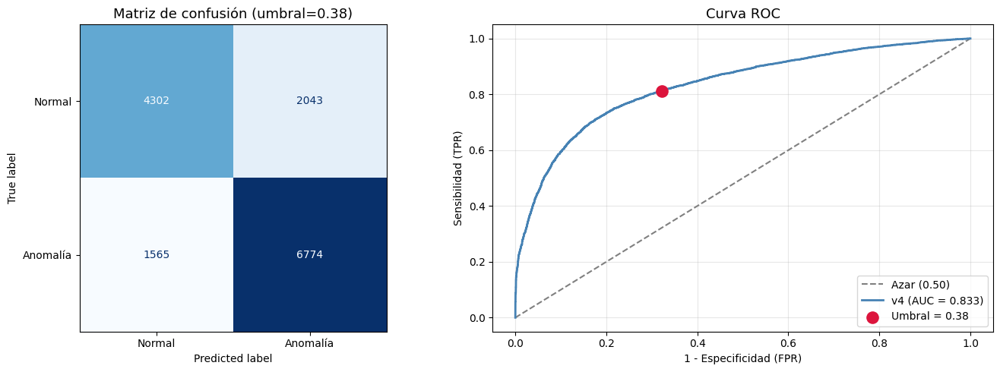

In [ ]:
# ══════════════════════════════════════════════════════════════════════
# CELDA 10 — Resumen de métricas de clasificación
# ══════════════════════════════════════════════════════════════════════

etiq_reales = df_test["label"].values
etiq_pred   = df_test["pred"].values
probs       = df_test["prob"].values

# Matriz de confusión
cm = confusion_matrix(etiq_reales, etiq_pred)
tn, fp, fn, tp = cm.ravel()

sensibilidad = tp / (tp + fn)
especificidad = tn / (tn + fp)
precision_v   = tp / (tp + fp)
f1 = 2 * precision_v * sensibilidad / (precision_v + sensibilidad)

fpr, tpr, _ = roc_curve(etiq_reales, probs)
auc_score = auc(fpr, tpr)

print("=" * 60)
print("RESUMEN — Clasificación v4 (test DatasetV2)")
print("=" * 60)
print(f"  AUC-ROC        : {auc_score:.3f}")
print(f"  Sensibilidad   : {sensibilidad:.3f}  (recall — detectar anomalías)")
print(f"  Especificidad  : {especificidad:.3f}  (descartar normales)")
print(f"  Precisión      : {precision_v:.3f}")
print(f"  F1-Score       : {f1:.3f}")
print(f"  Umbral         : {UMBRAL_CLAS}")
print(f"\n  VP: {tp:,}  |  VN: {tn:,}  |  FP: {fp:,}  |  FN: {fn:,}")
print("=" * 60)

# Matriz visual
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ConfusionMatrixDisplay(
    confusion_matrix=cm, display_labels=["Normal", "Anomalía"]
).plot(ax=ax1, colorbar=False, cmap="Blues")
ax1.set_title(f"Matriz de confusión (umbral={UMBRAL_CLAS})", fontsize=13)

ax2.plot([0, 1], [0, 1], "--", color="gray", label="Azar (0.50)")
ax2.plot(fpr, tpr, color="steelblue", lw=2,
         label=f"v4 (AUC = {auc_score:.3f})")
ax2.scatter([1 - especificidad], [sensibilidad],
            color="crimson", s=120, zorder=5,
            label=f"Umbral = {UMBRAL_CLAS}")
ax2.set_xlabel("1 - Especificidad (FPR)")
ax2.set_ylabel("Sensibilidad (TPR)")
ax2.set_title("Curva ROC", fontsize=13)
ax2.legend(loc="lower right")
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(str(RUTA_CHECKPOINTS / "resumen_clasificacion_evaluacion.png"),
            dpi=150, bbox_inches="tight")
plt.show()

## Celda 11 — Función `evaluar_radiografia()` para demo en vivo

Función que toma la ruta de UNA radiografía y genera un panel completo
con clasificación + Grad-CAM. Los compañeros pueden agregar regresión
y clustering a esta misma función.

**Uso en la exposición:**
```python
evaluar_radiografia("/ruta/a/radiografia.png")
```

In [ ]:
# ══════════════════════════════════════════════════════════════════════
# CELDA 11 — Función de evaluación individual (demo)
# ══════════════════════════════════════════════════════════════════════
# Elimina estas comillas superiores y las inferiores si la nueva version sale mal
# def evaluar_radiografia(ruta_imagen, edad_real=None):
   # """
   # Evalúa una radiografía con los tres módulos del Proyecto Vena.
#
 #   Por ahora solo clasificación está implementado.
  #  Los placeholders para regresión y clustering se completarán
   # cuando sus modelos estén listos.
    #"""
    # ── Cargar imagen ─────────────────────────────────────────────────
 #   img_batch, img_display = cargar_imagen(ruta_imagen)

    # ── CLASIFICACIÓN ─────────────────────────────────────────────────
   # prob = float(modelo_clas.predict(img_batch, verbose=0)[0, 0])
   # pred_clas = "Anomalía" if prob >= UMBRAL_CLAS else "Normal"
   # color_clas = "crimson" if pred_clas == "Anomalía" else "steelblue"

    # ── GRAD-CAM ──────────────────────────────────────────────────────
  # heatmap, _ = generar_gradcam(modelo_clas, img_batch, nombre_capa_conv)
  # superposicion = superponer_heatmap(img_display, heatmap, alfa=0.4)

    #Modificado por MArvin
#   pred_norm = float(modelo_reg.predict(img_batch, verbose=0)[0, 0])
#   edad_pred = pred_norm * EDAD_STD + EDAD_MEDIA

    # ── CLUSTERING (placeholder) ──────────────────────────────────────
    # TODO: Cuando el pipeline de clustering esté listo:
    # embedding = backbone.predict(img_batch, verbose=0)
    # embedding_2d = pca.transform(embedding)
    # cluster = kmeans.predict(embedding)
    # ── CLUSTERING ────────────────────────────────────────────────────────
    # Editado por Diego
  # embedding     = extractor.predict(img_batch, verbose=0)  # 1024 dims
  # edad_norm     = np.array([[(edad_real - 1) / (90 - 1)]]) if edad_real else np.array([[0.5]])
  # genero_cod    = np.array([[0.0]])  # default M=0 si no se pasa género
  # meta          = np.hstack([edad_norm * 10.0, genero_cod * 10.0])
  # emb_full      = np.hstack([scaler_cluster.transform(embedding), meta])
  # x_pca         = pca_cluster.transform(emb_full)
  # cluster_id    = int(kmeans_cluster.predict(x_pca)[0])
  # umap_xy = None  # omitido por incompatibilidad de versiones

    # ── VISUALIZACIÓN ─────────────────────────────────────────────────
    # Layout: 2 filas
    #   Fila 1: Radiografía | Grad-CAM superpuesto | Heatmap puro
    #   Fila 2: Panel de resultados (texto con métricas)
  # fig = plt.figure(figsize=(15, 8))

    # -- Fila 1: imágenes --
  # ax1 = fig.add_subplot(2, 3, 1)
  # ax1.imshow(img_display)
  # titulo_orig = "Radiografía original"
  # if edad_real is not None:
  #     titulo_orig += f"\nEdad real: {edad_real:.0f} años"
  # ax1.set_title(titulo_orig, fontsize=11)
  # ax1.axis("off")

  # ax2 = fig.add_subplot(2, 3, 2)
  # ax2.imshow(superposicion)
  # ax2.set_title("Grad-CAM superpuesto", fontsize=11)
  # ax2.axis("off")

 #  ax3 = fig.add_subplot(2, 3, 3)
 #  ax3.imshow(heatmap, cmap="jet", vmin=0, vmax=1)
 #  ax3.set_title("Mapa de atención", fontsize=11)
 #  ax3.axis("off")

    # -- Fila 2: paneles de texto --
    # Panel clasificación
#   ax4 = fig.add_subplot(2, 3, 4)
#   ax4.axis("off")
  # ax4.set_title("Clasificación", fontsize=12, fontweight="bold")
  # ax4.text(0.5, 0.6, f"{pred_clas}", fontsize=20, fontweight="bold",
  #          color=color_clas, ha="center", va="center",
    #        transform=ax4.transAxes)
  #ax4.text(0.5, 0.3, f"p(anomalía) = {prob:.3f}\numbral = {UMBRAL_CLAS}",
  #          fontsize=10, ha="center", va="center",
  #          transform=ax4.transAxes, color="gray")

    # Panel regresión
  # ax5 = fig.add_subplot(2, 3, 5)
  # ax5.axis("off")
  # ax5.set_title("Regresión de edad", fontsize=12, fontweight="bold")
  # if edad_pred is not None:
  #     ax5.text(0.5, 0.6, f"{edad_pred:.1f} años",
  #              fontsize=20, fontweight="bold", ha="center", va="center",
  #              transform=ax5.transAxes, color="teal")
  #     if edad_real is not None:
  #         error = abs(edad_pred - edad_real)
  #         ax5.text(0.5, 0.3, f"Error: {error:.1f} años",
  #                  fontsize=10, ha="center", va="center",
  #                  transform=ax5.transAxes, color="gray")
  # else:
  #     ax5.text(0.5, 0.5, "Pendiente",
  #              fontsize=16, ha="center", va="center",
  #              transform=ax5.transAxes, color="lightgray")

    # Panel clustering
  # ax6 = fig.add_subplot(2, 3, 6)
  # ax6.axis("off")
  # ax6.set_title("Agrupamiento", fontsize=12, fontweight="bold")
  # if cluster_id is not None:
  #   perfil = df_clusters[df_clusters['Cluster'] == cluster_id].iloc[0]
  #   ax6.text(0.5, 0.72, f'Cluster {cluster_id}',
  #           fontsize=22, fontweight='bold', ha='center', va='center',
  #           transform=ax6.transAxes, color='darkorange')
  #   ax6.text(0.5, 0.45, f'{perfil["Pct_enf"]:.0f}% enfermos · {perfil["Edad_media"]:.0f}a media',
  #           fontsize=9, ha='center', va='center',
  #           transform=ax6.transAxes, color='gray')
  #   ax6.text(0.5, 0.28, 'UMAP: no disponible en Colab',
  #           fontsize=9, ha='center', va='center',
  #           transform=ax6.transAxes, color='gray')
  # else:
  #     ax6.text(0.5, 0.5, "Pendiente",
  #              fontsize=16, ha="center", va="center",
  #              transform=ax6.transAxes, color="lightgray")

  # plt.suptitle("Evaluación integral — Proyecto Vena",
  #              fontsize=15, fontweight="bold")
  # plt.tight_layout()
  # plt.show()

  # return {
  #     "probabilidad": prob,
  #     "prediccion": pred_clas,
  #     "heatmap": heatmap,
  #     "edad_predicha": edad_pred,
  #     "cluster": cluster_id,
  #  }


#print("Función evaluar_radiografia() lista (con placeholders).")


IndentationError: unexpected indent (4248833865.py, line 7)

In [ ]:
# Espacio para clustering

df_clusters = pd.read_csv(RUTA_MODELOS_CLUSTER / 'v_kmeans_resumen_clusters.csv')
scaler_cluster = joblib.load(RUTA_MODELOS_CLUSTER / 'v_scaler.joblib')
pca_cluster    = joblib.load(RUTA_MODELOS_CLUSTER / 'v_pca_reducer.joblib')
kmeans_cluster = joblib.load(RUTA_MODELOS_CLUSTER / 'v_kmeans_model.joblib')
reducer_umap   = None
print('Nota: modelo UMAP omitido por incompatibilidad de versiones.\n')



Nota: modelo UMAP omitido por incompatibilidad de versiones.



/usr/local/lib/python3.12/dist-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.7.2 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator PCA from version 1.7.2 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator MiniBatchKMeans from version 1.7.2 when using version 1.6.1. This might lead to breaking code or invalid re

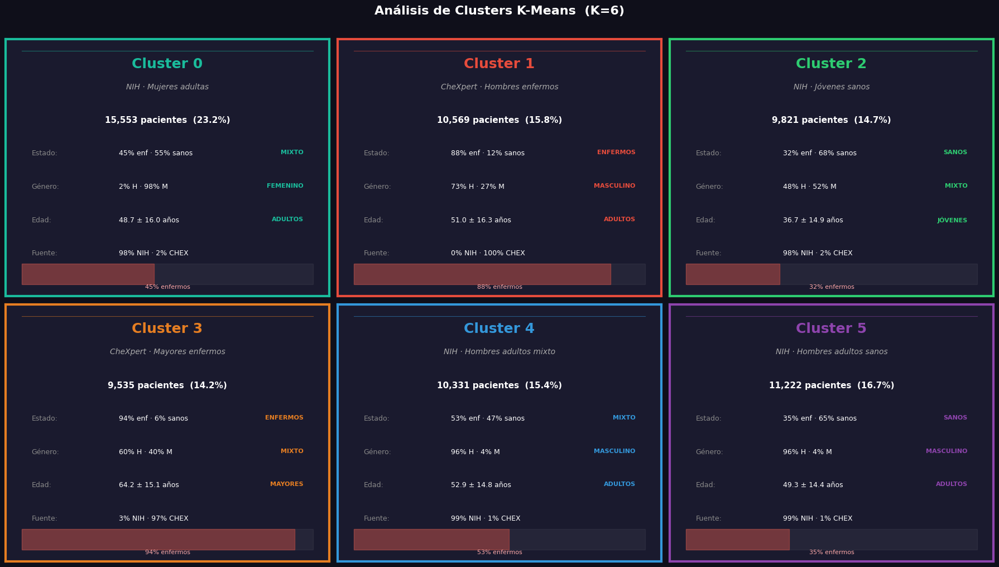

Panel de clusters guardado.


In [ ]:
# ── Análisis de clusters
RUTA_AGRUP = RUTA_VENA / "Notebooks" / "Apoyo" / "Agrupacion"

perfil_cols = ['Cluster','N','Pct_total','Pct_enf','Pct_sano',
               'Pct_M','Pct_F','Edad_media','Edad_std','Pct_NIH','Pct_CHEX']

# ── Panel visual de clusters ───────────────────────────────────────────
colores = ['#1abc9c','#e74c3c','#2ecc71','#e67e22','#3498db','#8e44ad']
etiquetas_cluster = [
    'NIH · Mujeres adultas',
    'CheXpert · Hombres enfermos',
    'NIH · Jóvenes sanos',
    'CheXpert · Mayores enfermos',
    'NIH · Hombres adultos mixto',
    'NIH · Hombres adultos sanos',
]

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for _, r in df_clusters.iterrows():
    k       = int(r['Cluster'])
    ax      = axes[k]
    color   = colores[k]

    perfil  = 'ENFERMOS' if r['Pct_enf'] > 60 else ('SANOS' if r['Pct_sano'] > 60 else 'MIXTO')
    genero  = 'MASCULINO' if r['Pct_M'] > 60 else ('FEMENINO' if r['Pct_F'] > 60 else 'MIXTO')
    edad_lbl= 'JÓVENES' if r['Edad_media'] < 40 else ('MAYORES' if r['Edad_media'] > 60 else 'ADULTOS')

    # Fondo y borde del cuadro
    ax.set_facecolor('#1a1a2e')
    for spine in ax.spines.values():
        spine.set_edgecolor(color)
        spine.set_linewidth(3)
    ax.set_xticks([]); ax.set_yticks([])

    # Título del cluster
    ax.text(0.5, 0.93, f'Cluster {k}', transform=ax.transAxes,
            ha='center', va='top', fontsize=18, fontweight='bold', color=color)
    ax.text(0.5, 0.83, etiquetas_cluster[k], transform=ax.transAxes,
            ha='center', va='top', fontsize=10, color='#aaaaaa', style='italic')

        # DESPUÉS
    ax.axhline(y=0.78, xmin=0.05, xmax=0.95,
              color=color, linewidth=0.8, alpha=0.5)

    # N de pacientes
    ax.text(0.5, 0.70, f'{int(r["N"]):,} pacientes  ({r["Pct_total"]:.1f}%)',
            transform=ax.transAxes, ha='center', va='top',
            fontsize=11, color='white', fontweight='bold')

    # Datos clínicos
    datos = [
        ('Estado',  f'{r["Pct_enf"]:.0f}% enf · {r["Pct_sano"]:.0f}% sanos',  perfil),
        ('Género',  f'{r["Pct_M"]:.0f}% H · {r["Pct_F"]:.0f}% M',             genero),
        ('Edad',    f'{r["Edad_media"]:.1f} ± {r["Edad_std"]:.1f} años',        edad_lbl),
        ('Fuente',  f'{r["Pct_NIH"]:.0f}% NIH · {r["Pct_CHEX"]:.0f}% CHEX',   ''),
    ]

    y = 0.57
    for label, valor, tag in datos:
        ax.text(0.08, y, f'{label}:', transform=ax.transAxes,
                ha='left', va='top', fontsize=9, color='#888888')
        ax.text(0.35, y, valor, transform=ax.transAxes,
                ha='left', va='top', fontsize=9, color='white')
        if tag:
            ax.text(0.92, y, tag, transform=ax.transAxes,
                    ha='right', va='top', fontsize=8, fontweight='bold', color=color)
        y -= 0.13

    # Barra de % enfermos al fondo
    ax.axhspan(0, 0.07, xmin=0.05, xmax=0.05 + 0.9 * (r['Pct_enf'] / 100),
               color='#e74c3c', alpha=0.4, transform=ax.transAxes)
    ax.axhspan(0, 0.07, xmin=0.05, xmax=0.95,
               color='white', alpha=0.05, transform=ax.transAxes)
    ax.text(0.5, 0.035, f'{r["Pct_enf"]:.0f}% enfermos',
            transform=ax.transAxes, ha='center', va='center',
            fontsize=8, color='#ffaaaa')

fig.patch.set_facecolor('#0f0f1a')
plt.suptitle(f'Análisis de Clusters K-Means  (K={kmeans_cluster.n_clusters})',
             fontsize=16, fontweight='bold', color='white', y=1.01)
plt.tight_layout()
plt.savefig(str(RUTA_AGRUP / 'kmeans_panel_clusters.png'), dpi=150,
            bbox_inches='tight', facecolor='#0f0f1a')
plt.show()
print('Panel de clusters guardado.')

────────────────────────────────────────────────────────────
  UMAP — 4 perspectivas
────────────────────────────────────────────────────────────


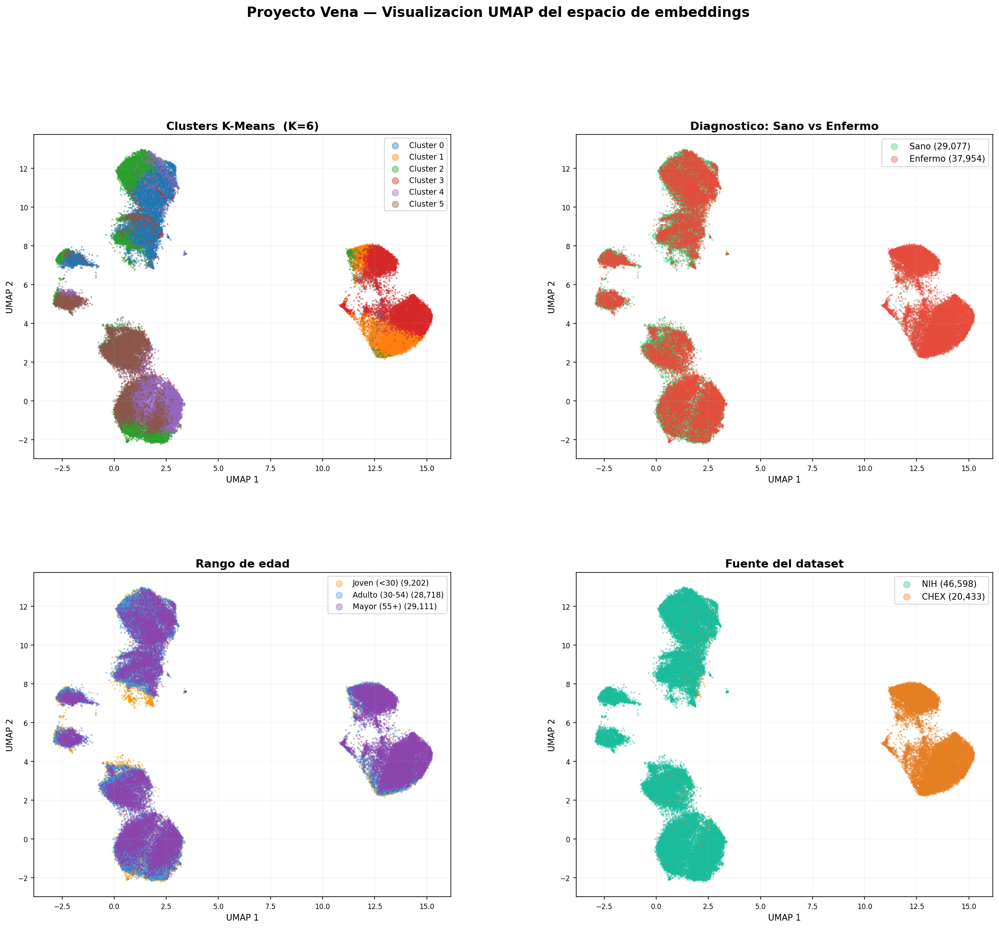

In [ ]:
# ── Mostrar gráficas ──────────────────────────────────────────────────
from IPython.display import display, Image as IPImage

print('─' * 60)
print('  UMAP — 4 perspectivas')
print('─' * 60)
display(IPImage(filename=str(RUTA_AGRUP / 'umap_panel_completo.png')))

────────────────────────────────────────────────────────────
  Perfil clínico por cluster
────────────────────────────────────────────────────────────


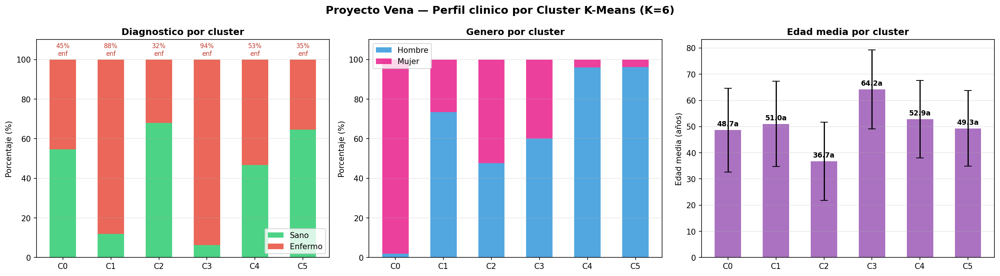

In [ ]:
print('─' * 60)
print('  Perfil clínico por cluster')
print('─' * 60)
display(IPImage(filename=str(RUTA_AGRUP / 'kmeans_perfil_clinico.png')))

────────────────────────────────────────────────────────────
  Heatmap de características
────────────────────────────────────────────────────────────


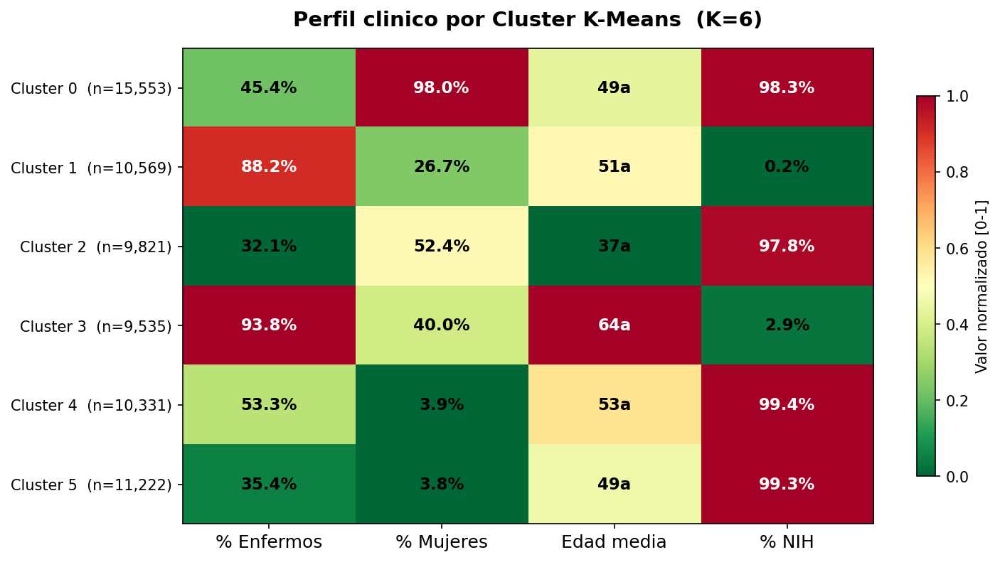

In [ ]:
print('─' * 60)
print('  Heatmap de características')
print('─' * 60)
display(IPImage(filename=str(RUTA_AGRUP / 'kmeans_heatmap.png')))

────────────────────────────────────────────────────────────
  Radiografías prototipo por cluster
────────────────────────────────────────────────────────────


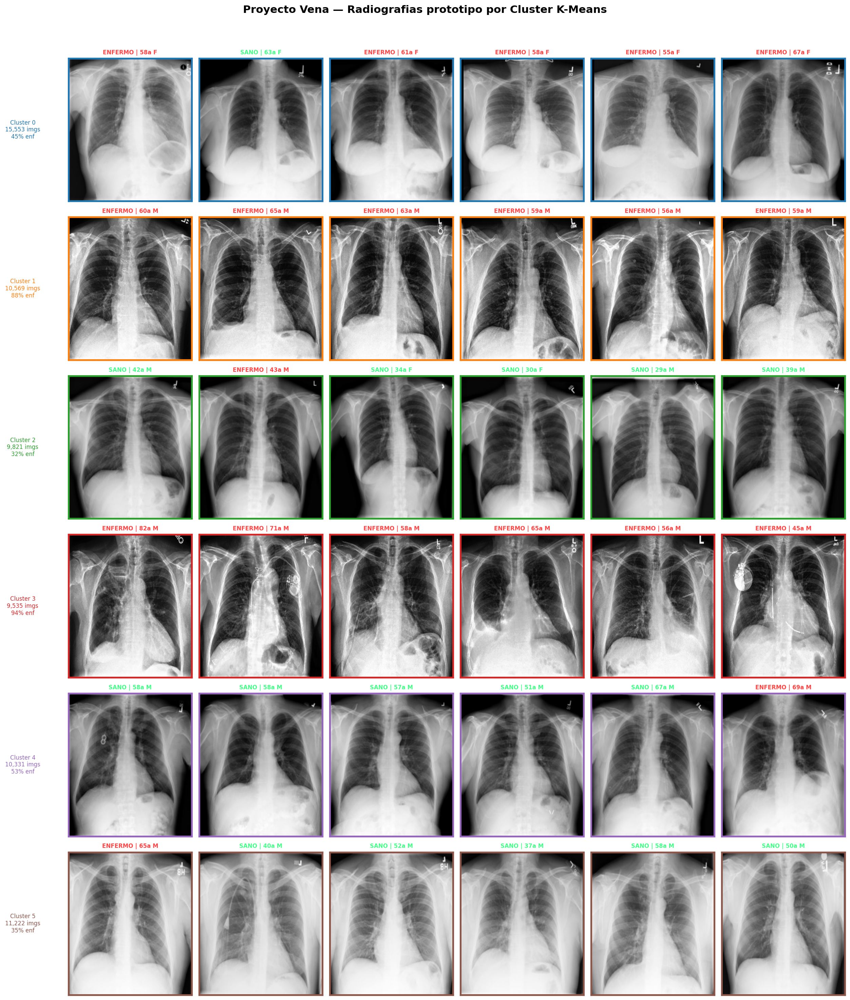

In [ ]:
print('─' * 60)
print('  Radiografías prototipo por cluster')
print('─' * 60)
display(IPImage(filename=str(RUTA_AGRUP / 'kmeans_rx_por_cluster.png')))

In [ ]:
def evaluar_radiografia(ruta_imagen, edad_real=None, paciente_id=None,
                        genero=None, fuente=None, original_finding=None):
    """
    Evalúa una radiografía con los tres módulos del Proyecto Vena.
    """
    # ── Cargar imagen ─────────────────────────────────────────────────
    img_batch, img_display = cargar_imagen(ruta_imagen)

    # ── CLASIFICACIÓN ─────────────────────────────────────────────────
    prob       = float(modelo_clas.predict(img_batch, verbose=0)[0, 0])
    pred_clas  = "Anomalía" if prob >= UMBRAL_CLAS else "Normal"
    color_clas = "#c0392b" if pred_clas == "Anomalía" else "#2980b9"

    # ── GRAD-CAM ──────────────────────────────────────────────────────
    heatmap, _    = generar_gradcam(modelo_clas, img_batch, nombre_capa_conv)
    superposicion = superponer_heatmap(img_display, heatmap, alfa=0.4)

    # ── REGRESIÓN — Modificado por Marvin ─────────────────────────────
    pred_norm = float(modelo_reg.predict(img_batch, verbose=0)[0, 0])
    edad_pred = pred_norm * EDAD_STD + EDAD_MEDIA

    # ── CLUSTERING — Editado por Diego ────────────────────────────────
    embedding  = extractor.predict(img_batch, verbose=0)
    _edad_norm = np.array([[(edad_real - 1) / (90 - 1)]]) if edad_real else np.array([[0.5]])
    _gen_cod   = np.array([[1.0]]) if genero == 'F' else np.array([[0.0]])
    meta       = np.hstack([_edad_norm * 10.0, _gen_cod * 10.0])
    emb_full   = np.hstack([scaler_cluster.transform(embedding), meta])
    x_pca      = pca_cluster.transform(emb_full)
    cluster_id = int(kmeans_cluster.predict(x_pca)[0])

    # ── Interpretar original_finding ──────────────────────────────────
    finding      = str(original_finding).strip() if original_finding and str(original_finding) != 'nan' else ""
    tags         = [t.strip() for t in finding.split("|")] if finding else []
    tiene_equipo = any(t in ("Support Devices", "Support Device") for t in tags)
    tags_patol   = [t for t in tags if t not in ("No Finding", "Support Devices", "Support Device", "")]

    if tags_patol:
        hallazgo_txt = " · ".join(tags_patol)
        estado_real  = "ENFERMO"
        color_estado = "#c0392b"
    else:
        hallazgo_txt = "Sin hallazgo"
        estado_real  = "SANO"
        color_estado = "#27ae60"

    equipo_txt = "⚠ Equipo médico presente" if tiene_equipo else ""

    # ── Descripción del cluster ────────────────────────────────────────
    colores_cluster = ['#1abc9c','#e74c3c','#2ecc71','#e67e22','#3498db','#8e44ad']
    perfil      = df_clusters[df_clusters['Cluster'] == cluster_id].iloc[0]
    pct_enf     = perfil['Pct_enf']
    edad_media  = perfil['Edad_media']
    pct_f       = perfil['Pct_F']
    pct_m       = perfil['Pct_M']

    tend_edad   = "jóvenes" if edad_media < 40 else ("mayores" if edad_media > 60 else "adultos")
    tend_genero = "mujeres" if pct_f > 60 else ("hombres" if pct_m > 60 else "mixto")
    tend_estado = "mayormente enfermos" if pct_enf > 60 else \
                  ("mayormente sanos" if pct_enf < 40 else "equilibrado")

    desc_cluster  = f"Grupo de {tend_genero} {tend_edad}"
    desc_cluster2 = f"{tend_estado} · {edad_media:.0f}a media"
    color_cluster = colores_cluster[cluster_id % len(colores_cluster)]

    # ── FIGURA ────────────────────────────────────────────────────────
    # Layout GridSpec:
    #   Fila 0 (header)  : título completo
    #   Fila 1 (main)    : [3 imgs vertical] | [datos paciente]
    #   Fila 2 (footer)  : Clasificación | Regresión | Agrupamiento
    import matplotlib.gridspec as gridspec
    import matplotlib.patches as mpatches

    BG      = '#0d0d0d'
    CARD_BG = '#111111'
    BORDER  = '#2a2a2a'

    def dibujar_caja(ax, color_borde=BORDER, lw=1):
        """Dibuja borde visible alrededor de un axes."""
        for sp in ax.spines.values():
            sp.set_visible(True)
            sp.set_edgecolor(color_borde)
            sp.set_linewidth(lw)

    fig = plt.figure(figsize=(15, 10), facecolor=BG)

    gs = gridspec.GridSpec(
        3, 2,
        height_ratios=[0.07, 0.54, 0.39],
        width_ratios=[0.52, 0.48],
        hspace=0.05, wspace=0.03,
        left=0.03, right=0.97, top=0.97, bottom=0.02,
        figure=fig
    )
     # ── Header ────────────────────────────────────────────────────────
    ax_hdr = fig.add_subplot(gs[0, :])
    ax_hdr.set_facecolor(BG)
    ax_hdr.axis('off')
    dibujar_caja(ax_hdr, '#e74c3c', lw=0.6)

    try:
        logo_img = plt.imread(str(RUTA_VENA / 'Notebooks' / 'Apoyo' / 'logo_vena.png'))
        logo_w = 0.052 * 2.3 * 1.09
        logo_h = 0.058 * 2.3 * 1.09
        ax_logo = fig.add_axes([-0.004, 0.938, logo_w, logo_h])
        ax_logo.imshow(logo_img)
        ax_logo.axis('off')
    except Exception:
        pass

    ax_hdr.text(0.5, 0.5, 'EVALUACIÓN INTEGRAL — PROYECTO VENA',
                transform=ax_hdr.transAxes,
                ha='center', va='center',
                fontsize=15, fontweight='bold',
                color='#e74c3c', fontfamily='monospace')

    # ── Imágenes (Diseño Personalizado 448x448) ───────────────────────
    # Redefinimos gs_imgs como 2 filas y 2 columnas
    gs_imgs = gridspec.GridSpecFromSubplotSpec(
        2, 2, subplot_spec=gs[1, 0], hspace=0.35, wspace=0.15
    )
    # Footer: 1 fila × 3 col
    gs_foot = gridspec.GridSpecFromSubplotSpec(
        1, 3, subplot_spec=gs[2, :], wspace=0.03
    )

    imgs_cfg = [
        (img_display,  'Radiografía original', None),
        (superposicion,'Grad-CAM superpuesto',  None),
        (heatmap,      'Mapa de atención',      'jet'),
    ]

    # --- FILA SUPERIOR: Dos imágenes en horizontal ---
    for col in range(2):
        data, titulo, cmap = imgs_cfg[col]
        ax = fig.add_subplot(gs_imgs[0, col])
        ax.set_facecolor(BG)
        kw = dict(cmap=cmap, vmin=0, vmax=1) if cmap else {}

        # Forzamos visualización a 448x448 (aspecto)
        ax.imshow(data, **kw, extent=[0, 448, 448, 0])

        # Etiqueta abajo de color blanco
        ax.set_xlabel(titulo, fontsize=8, color='white', labelpad=5)
        ax.set_xticks([]); ax.set_yticks([])
        dibujar_caja(ax, BORDER)

   # --- FILA INFERIOR: Tercera imagen CENTRADA ---
    data_3, titulo_3, cmap_3 = imgs_cfg[2]

    # Usamos [1, :] para que ocupe todo el ancho de la fila 1 (centrado automático)
    ax_img3 = fig.add_subplot(gs_imgs[1, :])
    ax_img3.set_facecolor(BG)
    kw_3 = dict(cmap=cmap_3, vmin=0, vmax=1) if cmap_3 else {}

    # aspect='equal' es CLAVE para que la imagen se mantenga cuadrada y centrada
    ax_img3.imshow(data_3, **kw_3, extent=[0, 448, 448, 0], aspect='equal')

    # Etiqueta blanca abajo
    ax_img3.set_xlabel(titulo_3, fontsize=8, color='white', labelpad=5)

    ax_img3.set_xticks([]); ax_img3.set_yticks([])
    dibujar_caja(ax_img3, BORDER)

    # ── Datos del paciente ────────────────────────────────────────────
    ax_dat = fig.add_subplot(gs[1, 1])
    ax_dat.set_facecolor(CARD_BG)
    ax_dat.axis('off')
    dibujar_caja(ax_dat, BORDER)

    def fila(ax, y, lbl, val, cv='white', fs=10):
        ax.text(0.05, y, lbl, transform=ax.transAxes,
                ha='left', va='top', fontsize=fs, color='#666666')
        ax.text(0.40, y, val, transform=ax.transAxes,
                ha='left', va='top', fontsize=fs,
                color=cv, fontweight='bold')

    ax_dat.text(0.5, 0.96, 'DATOS DEL PACIENTE',
                transform=ax_dat.transAxes,
                ha='center', va='top', fontsize=11,
                fontweight='bold', color='#e74c3c')

    y = 0.84
    if paciente_id is not None:
        fila(ax_dat, y, 'ID',       str(paciente_id));                      y -= 0.11
    if edad_real is not None:
        fila(ax_dat, y, 'Edad',     f'{int(edad_real)} años');              y -= 0.11
    if genero:
        fila(ax_dat, y, 'Género',   'Masculino' if genero=='M' else 'Femenino'); y -= 0.11
    if fuente:
        fila(ax_dat, y, 'Fuente',   fuente);                                y -= 0.11

    ax_dat.axhline(y=y+0.05, xmin=0.04, xmax=0.96, color=BORDER, linewidth=0.8)
    y -= 0.03

    fila(ax_dat, y, 'Hallazgo', hallazgo_txt, cv=color_estado, fs=9); y -= 0.11
    fila(ax_dat, y, 'Estado',   estado_real,  cv=color_estado);        y -= 0.11

    if equipo_txt:
        ax_dat.text(0.5, y, equipo_txt,
                    transform=ax_dat.transAxes,
                    ha='center', va='top', fontsize=9,
                    color='#f39c12', fontweight='bold')

    # ── Footer: Clasificación ─────────────────────────────────────────
    ax_c = fig.add_subplot(gs_foot[0])
    ax_c.set_facecolor(CARD_BG); ax_c.axis('off')
    dibujar_caja(ax_c, BORDER)

    ax_c.text(0.5, 0.79, 'CLASIFICACIÓN', transform=ax_c.transAxes,
              ha='center', va='top', fontsize=10, color='#de9d10', fontweight='bold')
    ax_c.text(0.5, 0.63, pred_clas, transform=ax_c.transAxes,
              ha='center', va='top', fontsize=22, fontweight='bold', color=color_clas)
    ax_c.text(0.5, 0.40, f'p(anomalía) = {prob:.3f}', transform=ax_c.transAxes,
              ha='center', va='top', fontsize=10, color='white')
    ax_c.text(0.5, 0.30, f'umbral = {UMBRAL_CLAS}', transform=ax_c.transAxes,
              ha='center', va='top', fontsize=9, color='#444444')

    # ── Footer: Regresión ─────────────────────────────────────────────
    ax_r = fig.add_subplot(gs_foot[1])
    ax_r.set_facecolor(CARD_BG); ax_r.axis('off')
    dibujar_caja(ax_r, BORDER)

    ax_r.text(0.5, 0.79, 'REGRESIÓN DE EDAD', transform=ax_r.transAxes,
              ha='center', va='top', fontsize=10, color='#de9d10', fontweight='bold')
    ax_r.text(0.5, 0.63, f'{edad_pred:.1f} años', transform=ax_r.transAxes,
              ha='center', va='top', fontsize=22, fontweight='bold', color='#1abc9c')
    if edad_real is not None:
        error = abs(edad_pred - edad_real)
        ax_r.text(0.5, 0.40, f'Error: {error:.1f} años', transform=ax_r.transAxes,
                  ha='center', va='top', fontsize=10, color='#cc0404')

    # ── Footer: Agrupamiento ──────────────────────────────────────────
    ax_k = fig.add_subplot(gs_foot[2])
    ax_k.set_facecolor(CARD_BG); ax_k.axis('off')
    dibujar_caja(ax_k, color_cluster, lw=1.5)

    ax_k.text(0.5, 0.79, 'AGRUPAMIENTO', transform=ax_k.transAxes,
              ha='center', va='top', fontsize=10, color='#de9d10', fontweight='bold')
    ax_k.text(0.5, 0.63, f'Cluster {cluster_id}', transform=ax_k.transAxes,
              ha='center', va='top', fontsize=22, fontweight='bold', color=color_cluster)
    ax_k.text(0.5, 0.40, desc_cluster, transform=ax_k.transAxes,
              ha='center', va='top', fontsize=10, color='white')
    ax_k.text(0.5, 0.30, desc_cluster2, transform=ax_k.transAxes,
              ha='center', va='top', fontsize=9, color='#666666')

    plt.savefig('evaluacion_vena.png', dpi=150,
                bbox_inches='tight', facecolor=BG)
    plt.show()

    return {
        "probabilidad" : prob,
        "prediccion"   : pred_clas,
        "heatmap"      : heatmap,
        "edad_predicha": edad_pred,
        "cluster"      : cluster_id,
    }


print("Función evaluar_radiografia() lista.")

Función evaluar_radiografia() lista.


## Celda 12 — Demo: evaluar una radiografía del test set

Ejemplo funcional que tus compañeros pueden usar como referencia.

In [ ]:
# ══════════════════════════════════════════════════════════════════════
# CELDA 12 — Demo interactiva
# ══════════════════════════════════════════════════════════════════════

# OPCIÓN A: imagen aleatoria (re-ejecutar celda = imagen nueva)
#ejemplo = df_test.sample(n=1).iloc[0]

# OPCIÓN B: elegir por índice (descomenta y cambia el número)
# ejemplo = df_test.iloc[42]

# OPCIÓN C: elegir por escenario (descomenta una)
# ejemplo = df_test[df_test["escenario"] == "VP"].sample(n=1).iloc[0]
# ejemplo = df_test[df_test["escenario"] == "FN"].sample(n=1).iloc[0]

#resultado = evaluar_radiografia(
#    ruta_imagen = ejemplo["ruta_completa"],
#    edad_real   = ejemplo.get("patient_age", None)
#)

#print(f"\nReal: {'Anomalía' if ejemplo['label'] == 1 else 'Normal'}")
#print(f"Pred: {resultado['prediccion']} (p = {resultado['probabilidad']:.3f})")


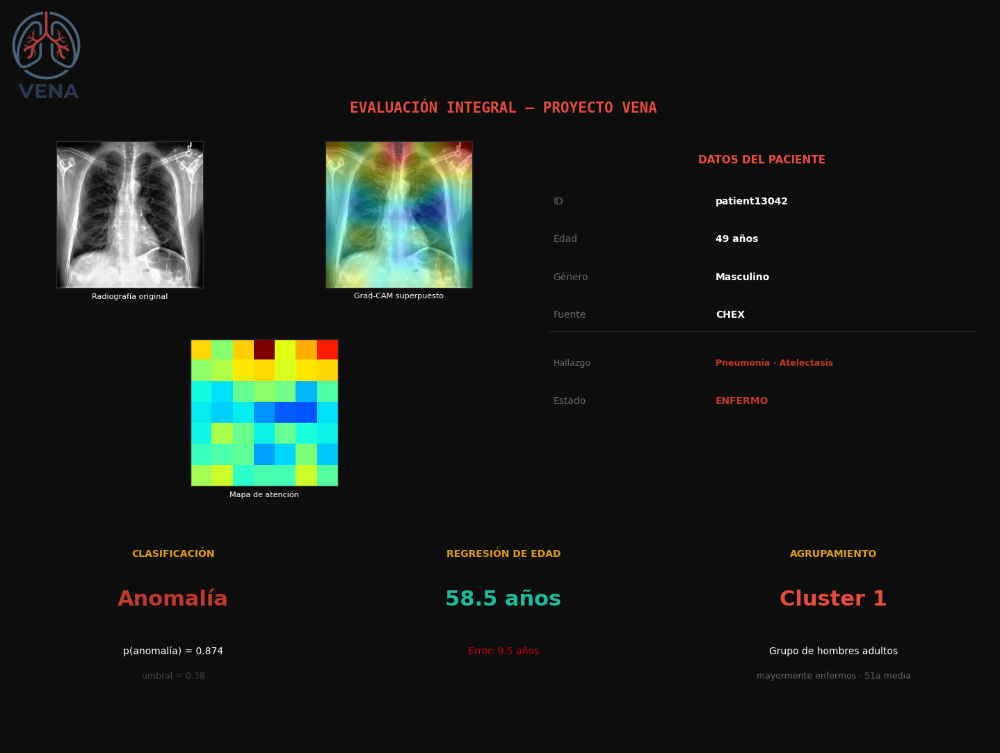


Real: Anomalía
Pred: Anomalía (p = 0.874)


In [ ]:
# ══════════════════════════════════════════════════════════════════════
# CELDA 12 — Evaluacion Final
# ══════════════════════════════════════════════════════════════════════

ejemplo = df_test.sample(n=1).iloc[0]

resultado = evaluar_radiografia(
    ruta_imagen      = ejemplo["ruta_completa"],
    edad_real        = ejemplo.get("patient_age", None),
    paciente_id      = ejemplo.get("patient_id", None),
    genero           = ejemplo.get("patient_gender", None),
    fuente           = ejemplo.get("source", None),
    original_finding = ejemplo.get("original_finding", None),
)

print(f"\nReal: {'Anomalía' if ejemplo['label'] == 1 else 'Normal'}")
print(f"Pred: {resultado['prediccion']} (p = {resultado['probabilidad']:.3f})")

---

# SECCIÓN 2 — Regresión de edad

**(Por implementar — compañero responsable)**

### Guía de implementación

**Modelo a cargar:** `regresion_v4.keras` (formato `.h5`, usar `load_model(..., compile=False)`)

**Datos necesarios del StandardScaler:**
```python
# Valores obtenidos en NB03 v2 (Celda 5)
EDAD_MEDIA = 50.3   # media del train set
EDAD_STD   = 17.1   # std del train set
```

**Para desnormalizar predicciones:**
```python
edad_predicha = pred_normalizada * EDAD_STD + EDAD_MEDIA
```

**Visualizaciones sugeridas:**
1. Scatter plot: edad real vs edad predicha (con línea diagonal de predicción perfecta)
2. Histograma de errores
3. MAE por rango de edad (ya existe en NB03 v2)
4. Ejemplos individuales: radiografía + edad real + edad predicha

**Métricas a reportar:** MAE = 5.81 años, RMSE = 7.42 años, R² = 0.813

**Para integrar con `evaluar_radiografia()`:** agregar la predicción de edad
al panel visual y al diccionario de retorno.

In [ ]:

print(f"Modelo regresión cargado:{RUTA_MODELO_REG.name}")
print(f" Entrada: {modelo_reg.input_shape}")
print(f"  Salida: {modelo_reg.output_shape}")


#Cargar datos de test
gen_reg = ImageDataGenerator(rescale=1.0 / 255)
flujo_reg = gen_reg.flow_from_dataframe(
    dataframe   = df_test,
    directory   = str(RUTA_BASE),
    x_col       = "path",
    y_col       = "label",       # no se usa para regresión, solo para que no falle
    class_mode  = "raw",
    target_size = (TAMANO_IMAGEN, TAMANO_IMAGEN),
    batch_size  = 64,
    shuffle     = False,
    color_mode  = "rgb",
    seed        = 42
)

print("\nGenerando predicciones de edad...")
preds_norm = modelo_reg.predict(flujo_reg, verbose=1)
preds_norm = preds_norm[:len(df_test)].flatten()

# ── 4. Desnormalizar predicciones ─────────────────────────────────────
edades_pred = preds_norm * EDAD_STD + EDAD_MEDIA

# ── 5. Calcular métricas (si el CSV tiene edades reales) ──────────────
col_edad = "patient_age"   # ← cambia aquí si tu columna tiene otro nombre

if col_edad in df_test.columns:
    edades_real = df_test[col_edad].values.astype(float)
    errores     = np.abs(edades_pred - edades_real)
    mae         = errores.mean()
    rmse        = np.sqrt(((edades_pred - edades_real) ** 2).mean())
    ss_res      = ((edades_real - edades_pred) ** 2).sum()
    ss_tot      = ((edades_real - edades_real.mean()) ** 2).sum()
    r2          = 1 - ss_res / ss_tot

    print(f"\n{'═' * 45}")
    print("MÉTRICAS — Regresión de edad v4")
    print(f"{'═' * 45}")
    print(f"  MAE  : {mae:.2f} años")
    print(f"  RMSE : {rmse:.2f} años")
    print(f"  R²   : {r2:.3f}")
    print(f"{'═' * 45}")

    # ── 6. Scatter: predicción vs realidad ────────────────────────────
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

    ax1.scatter(edades_real, edades_pred, alpha=0.3, s=10, color="steelblue")
    lim = [0, 100]
    ax1.plot(lim, lim, "r--", lw=2, label="Predicción perfecta")
    ax1.set_xlabel("Edad real (años)")
    ax1.set_ylabel("Edad predicha (años)")
    ax1.set_title(f"Predicción vs Realidad\nMAE: {mae:.1f} | RMSE: {rmse:.1f} | R²: {r2:.3f}")
    ax1.legend()
    ax1.grid(alpha=0.3)

    # ── 7. Histograma de errores ──────────────────────────────────────
    errores_con_signo = edades_pred - edades_real
    ax2.hist(errores_con_signo, bins=60, color="steelblue", edgecolor="white")
    ax2.axvline(0,   color="red",    linestyle="--", lw=2, label="Error 0")
    ax2.axvline( mae, color="orange", linestyle=":",  lw=2, label=f"MAE = {mae:.1f} años")
    ax2.axvline(-mae, color="orange", linestyle=":",  lw=2)
    ax2.set_xlabel("Error (años)")
    ax2.set_ylabel("Frecuencia")
    ax2.set_title("Distribución de errores (predicho − real)")
    ax2.legend()
    ax2.grid(alpha=0.3)

    plt.suptitle("Evaluación — Regresión de Edad v4", fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.savefig(str(RUTA_CHECKPOINTS / "evaluacion_regresion_v4_nb05.png"),
                dpi=150, bbox_inches="tight")
    plt.show()

else:
    print(f"Columna '{col_edad}' no encontrada en df_test — se omiten métricas.")
    print("Las predicciones están en la variable 'edades_pred'.")

---

# SECCIÓN 3 — Agrupamiento (clustering)

**(Por implementar — compañero responsable)**

### Guía de implementación

**Enfoque recomendado:**
1. Extraer embeddings del backbone: pasar imágenes por el backbone
   hasta `GlobalAveragePooling2D` → vector de 1024 dimensiones por imagen
2. Reducir dimensionalidad con UMAP o t-SNE a 2D para visualización
3. Aplicar K-Means o DBSCAN sobre los embeddings

**Backbone disponible:** `backbone_densenet121_v4.keras` (salida: 7×7×1024).
Agregar `GlobalAveragePooling2D` para obtener vectores de 1024.

**Visualizaciones sugeridas:**
1. Scatter 2D (UMAP/t-SNE) coloreado por cluster
2. Mismo scatter coloreado por: Normal/Anomalía, rango de edad, fuente (NIH/CheXpert)
3. Imágenes prototipo de cada cluster (las más cercanas al centroide)
4. Métricas: Silhouette Score, inercia (para codo de K-Means)

**Para integrar con `evaluar_radiografia()`:** mostrar a qué cluster
pertenece la imagen y su posición en el mapa UMAP/t-SNE.